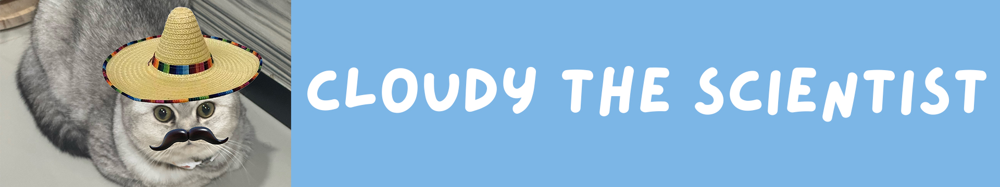

# ITCS227 Introduction to Data Science - Cloudy The Scientist (Group No.7)
# Garbage Classification (Recyclable or Non-Recyclable)

### Team Members:
- **6688077**: Bhumipat Pengpaiboon
- **6688108**: Napas Siripaskrittakul
- **6688142**: Krerkkiat Wattanaporn
- **6688178**: Fangyu Liu
- **6688228**: Nunnapat Vitinuntakit

<br>


---

The principles of zero-waste are straightforward actions to *minimize waste*, *conserve resources*, and *safeguard the environment*. By embracing these practices, we can make zero-waste living both simpler and more effective.

## Part 1 - Traning model

##### Before you start, Let's make sure that we have access to GPU. We can use `nvidia-smi` command to check GPU information.

In [1]:
!nvidia-smi
!nvcc --version

import torch
print(torch.cuda.is_available())

# Chekcing cuda
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"YOLOv8 is running on: {device}")

Sat Apr 12 01:08:16 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.86.15              Driver Version: 570.86.15      CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060        Off |   00000000:01:00.0  On |                  N/A |
|  0%   38C    P8             N/A /  115W |     101MiB /   8188MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

#### Install YOLOv8 and Pytorch (RECOMMENED FOR UBUNTU OS)

##### YOLOv8 and Pytorch can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [2]:
!pip install ultralytics
!pip3 install --pre torch torchvision torchaudio --index-url https://download.pytorch.org/whl/nightly/cu128 # For CUDA 12.8 only!

from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from IPython.display import display, Image

# Testing import
import torch

# Checking Pyhton is using GPU
print(f"Is PyTorch using GPU? {torch.cuda.is_available()}")

# Check current device
print(f"Current Device: {torch.cuda.current_device()}")

# Check device name
print(f"Device Name: {torch.cuda.get_device_name(0)}")

Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7794MiB)
Setup complete ✅ (12 CPUs, 15.5 GB RAM, 58.3/98.9 GB disk)
Is PyTorch using GPU? True
Current Device: 0
Device Name: NVIDIA GeForce RTX 4060
Setup complete ✅ (12 CPUs, 15.5 GB RAM, 58.3/98.9 GB disk)
Is PyTorch using GPU? True
Current Device: 0
Device Name: NVIDIA GeForce RTX 4060


In [3]:
import torch

print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Device count:", torch.cuda.device_count())
    print("Device name:", torch.cuda.get_device_name(0))
    print("Torch CUDA version:", torch.version.cuda)
    print("Torch version:", torch.__version__)
else:
    print("❌ No GPU detected by PyTorch.")


CUDA available: True
Device count: 1
Device name: NVIDIA GeForce RTX 4060
Torch CUDA version: 12.8
Torch version: 2.8.0.dev20250411+cu128


##### Unzip and Preparing the data

In [4]:
import zipfile
import os

zip_path = 'Dataset.zip'
extract_to = '.'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
    print(f"Extracted to '{extract_to}'.")

Extracted to '.'.


##### Create custom yaml for custom dataset

In [5]:
import yaml
# Setup the custom dataset without using roboflow
dataset_config = {
    "train": "../train/images",  # Path to Training images
    "val": "../valid/images",      # Path to Validation images
    "test": "../test/images",      # Path to Testing images
    "nc": 6,  # Number of classes
    "names": ['BIODEGRADABLE', 'CARDBOARD', 'GLASS', 'METAL', 'PAPER', 'PLASTIC'] # Name of Each classes
}

# Save to setup.yaml
with open("Dataset/data.yaml", "w") as file:
    yaml.dump(dataset_config, file, default_flow_style=False)

print("data.yaml created!")

data.yaml created!


# Custom Training
### Yolov8 Model: yolov8n.pt as Nano model size

In [ ]:
from ultralytics import YOLO
import os

# Load a pretrained YOLO model: yolov8n
model = YOLO("yolov8n.pt")  # The model

cwd = os.getcwd()
path = os.path.join(cwd, "Dataset", "data.yaml")

# Train the model
model.train(data=path, epochs=50, imgsz=640, device=0)

100%|██████████| 6.25M/6.25M [00:00<00:00, 90.5MB/s]


Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7794MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/icebear_bares/Desktop/Cloudythescientist/Dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sh

100%|██████████| 5.35M/5.35M [00:00<00:00, 90.8MB/s]


AMP: checks passed ✅


train: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/train/labels.cache... 20752 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20752/20752 [00:00<?, ?it/s]
val: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/valid/labels.cache... 2098 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2098/2098 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.79G      1.365      2.409      1.457        162        640: 100%|██████████| 1297/1297 [02:31<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:10<00:00,  6.28it/s]


                   all       2098      18916       0.37        0.3       0.29      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.66G      1.369      1.837      1.452        278        640: 100%|██████████| 1297/1297 [02:25<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:10<00:00,  6.58it/s]


                   all       2098      18916       0.38      0.321      0.303      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.66G      1.405      1.814      1.491         84        640: 100%|██████████| 1297/1297 [02:23<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.01it/s]


                   all       2098      18916      0.428      0.306      0.318      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.66G      1.429      1.766      1.514        234        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.99it/s]


                   all       2098      18916      0.378       0.32      0.325      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.66G      1.394      1.649       1.49        173        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.01it/s]


                   all       2098      18916      0.476      0.318      0.346      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.66G      1.362      1.554      1.463        135        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.93it/s]


                   all       2098      18916      0.498      0.376      0.417      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.67G       1.34      1.502      1.455        146        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.03it/s]


                   all       2098      18916      0.505      0.376      0.421      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.67G      1.321      1.453      1.442        125        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.99it/s]


                   all       2098      18916      0.512      0.382      0.435      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.67G      1.312      1.418      1.432        158        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.07it/s]

                   all       2098      18916      0.523      0.398      0.441      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.67G      1.303      1.387       1.43        149        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.04it/s]

                   all       2098      18916      0.496      0.435      0.444      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.67G      1.276      1.347      1.413        136        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.00it/s]

                   all       2098      18916      0.491      0.411      0.439      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.67G      1.279      1.325      1.407        212        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.00it/s]

                   all       2098      18916      0.569      0.419       0.48      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.67G      1.274       1.31      1.401        173        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.95it/s]


                   all       2098      18916      0.525      0.418      0.465      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.67G      1.259      1.281      1.395        150        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.08it/s]

                   all       2098      18916      0.557      0.425       0.48      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.67G      1.241      1.255      1.385        170        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.13it/s]

                   all       2098      18916      0.542      0.436      0.492      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.67G       1.24       1.24       1.38        272        640: 100%|██████████| 1297/1297 [02:23<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.02it/s]

                   all       2098      18916      0.588      0.428      0.495      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.67G      1.236      1.229      1.379        149        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.13it/s]

                   all       2098      18916      0.545       0.45        0.5      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.67G      1.229      1.211      1.374        132        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.95it/s]

                   all       2098      18916      0.557      0.461      0.506      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.67G      1.224      1.196      1.367        303        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.98it/s]

                   all       2098      18916      0.578      0.457      0.514      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.67G      1.213      1.178      1.362        239        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.10it/s]

                   all       2098      18916      0.582      0.465      0.522      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.67G      1.208      1.163      1.357        256        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.11it/s]

                   all       2098      18916      0.578      0.459      0.512      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.67G      1.212      1.153      1.356        187        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.11it/s]

                   all       2098      18916      0.595      0.482      0.532      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.67G       1.21       1.15      1.355        244        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.10it/s]

                   all       2098      18916       0.57      0.488      0.532      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.67G       1.21      1.132      1.351        239        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.01it/s]

                   all       2098      18916      0.592       0.47      0.536      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.67G      1.184      1.118      1.343        138        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.05it/s]

                   all       2098      18916      0.607      0.468      0.536      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.67G      1.197      1.109      1.345        210        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.13it/s]

                   all       2098      18916      0.602      0.478      0.543      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.67G       1.19      1.103      1.337        101        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.12it/s]

                   all       2098      18916        0.6      0.491      0.543      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.67G      1.188      1.093      1.335        140        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.15it/s]

                   all       2098      18916      0.613      0.484       0.54      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.67G      1.174      1.073       1.33        157        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.17it/s]

                   all       2098      18916      0.584      0.508      0.546      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.67G       1.18      1.068       1.33        416        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.19it/s]

                   all       2098      18916      0.618      0.491      0.551      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.67G       1.17      1.052       1.32        178        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.14it/s]

                   all       2098      18916       0.62      0.495      0.549      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.67G      1.166      1.044      1.319        129        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.13it/s]

                   all       2098      18916      0.616      0.499      0.553      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.67G      1.154      1.033      1.315        142        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.16it/s]

                   all       2098      18916      0.611      0.497      0.552      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.67G      1.153      1.028      1.313        104        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.18it/s]

                   all       2098      18916      0.625      0.493      0.554      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.67G      1.151      1.022      1.311        196        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.17it/s]

                   all       2098      18916      0.618      0.502      0.557      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.67G      1.152       1.01      1.308        195        640: 100%|██████████| 1297/1297 [02:24<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.07it/s]

                   all       2098      18916      0.625      0.506      0.557      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.67G      1.139     0.9956      1.302        248        640: 100%|██████████| 1297/1297 [02:23<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.16it/s]

                   all       2098      18916      0.626        0.5      0.558       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.67G      1.145     0.9994        1.3        144        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.19it/s]

                   all       2098      18916      0.625       0.51      0.561      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.67G      1.136     0.9789      1.295        168        640: 100%|██████████| 1297/1297 [02:24<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.07it/s]

                   all       2098      18916      0.634      0.509      0.565      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.67G      1.122     0.9781      1.294        181        640: 100%|██████████| 1297/1297 [02:23<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.17it/s]

                   all       2098      18916      0.637      0.506      0.564      0.393


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.67G      1.145     0.9504      1.323        103        640: 100%|██████████| 1297/1297 [02:20<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.07it/s]

                   all       2098      18916       0.63      0.514      0.564      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.67G       1.13     0.9259      1.311        152        640: 100%|██████████| 1297/1297 [02:19<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.18it/s]

                   all       2098      18916       0.63      0.512      0.562      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.67G      1.129     0.9151      1.309         62        640: 100%|██████████| 1297/1297 [02:20<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.05it/s]

                   all       2098      18916      0.634      0.508      0.563      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.67G      1.117     0.8994      1.302         47        640: 100%|██████████| 1297/1297 [02:20<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  6.99it/s]

                   all       2098      18916      0.627      0.509      0.563      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.67G      1.102     0.8799      1.293        178        640: 100%|██████████| 1297/1297 [02:20<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.17it/s]

                   all       2098      18916      0.631       0.51      0.564      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.67G      1.102     0.8695      1.291        155        640: 100%|██████████| 1297/1297 [02:19<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.21it/s]

                   all       2098      18916      0.633      0.505      0.563      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.67G      1.101     0.8622      1.288         42        640: 100%|██████████| 1297/1297 [02:20<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.10it/s]

                   all       2098      18916      0.632      0.512      0.563      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.67G       1.09     0.8516      1.284         73        640: 100%|██████████| 1297/1297 [02:19<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.19it/s]

                   all       2098      18916      0.629      0.514      0.563      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.67G      1.088     0.8415      1.277         81        640: 100%|██████████| 1297/1297 [02:19<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.18it/s]

                   all       2098      18916      0.628      0.514      0.564      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.67G      1.076     0.8242      1.271        102        640: 100%|██████████| 1297/1297 [02:19<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:09<00:00,  7.18it/s]

                   all       2098      18916      0.629      0.513      0.564      0.395



50 epochs completed in 2.129 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7794MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:10<00:00,  6.43it/s]


                   all       2098      18916      0.629      0.513      0.564      0.395
         BIODEGRADABLE        676      13637      0.822       0.49      0.643      0.374
             CARDBOARD        438       1292      0.763      0.519      0.634      0.485
                 GLASS        805       2380      0.859      0.719      0.821      0.618
                 METAL        398       1360      0.784       0.64      0.727      0.507
                 PAPER         15         33      0.103      0.182     0.0807     0.0671
               PLASTIC         91        214      0.441      0.528      0.476       0.32
Speed: 0.2ms preprocess, 1.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x74e7396cc6e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

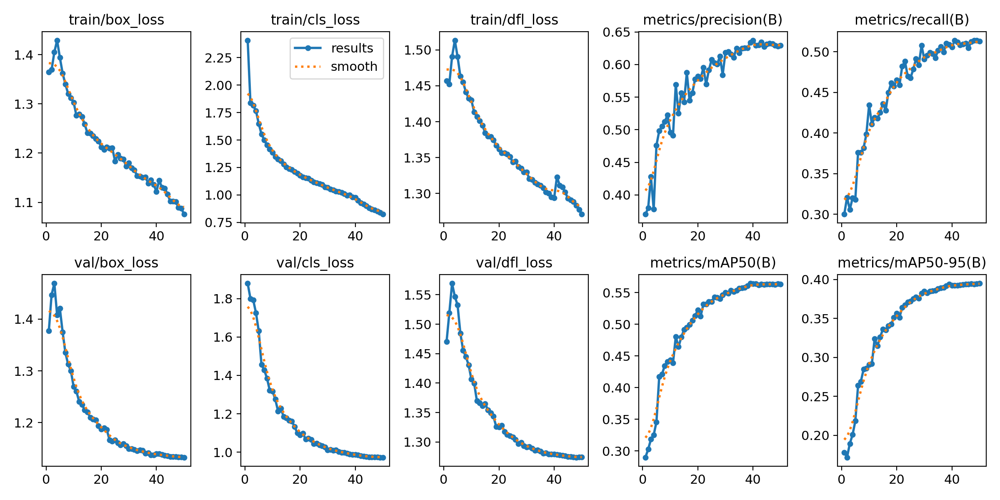

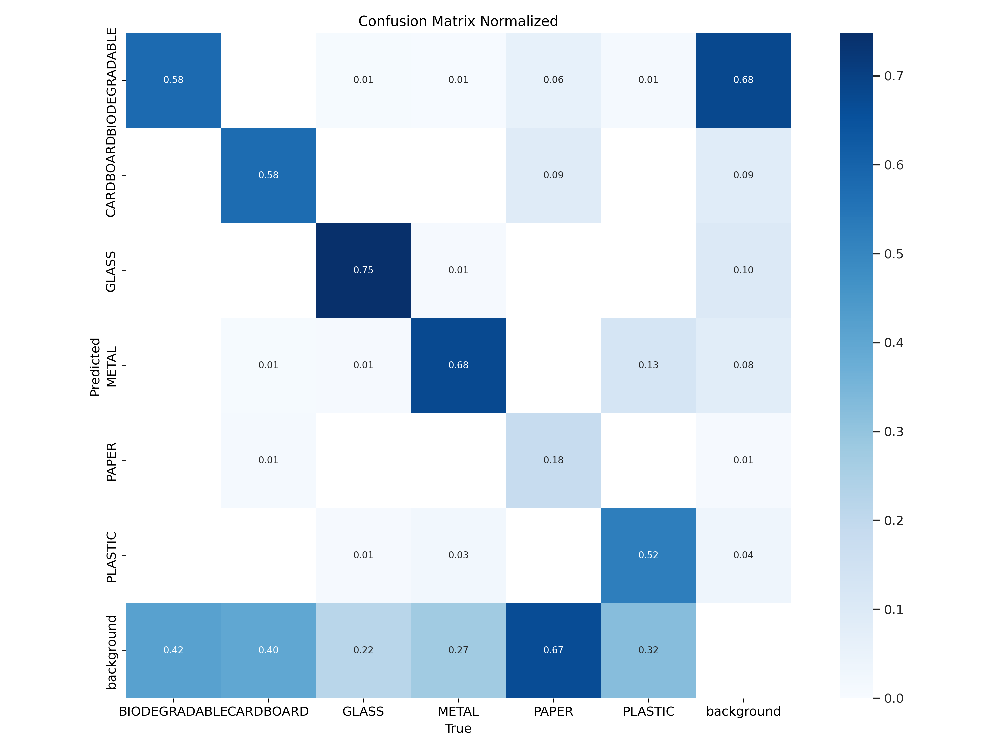

Best weights path: runs/detect/train/weights/best.pt


In [13]:
import os
from IPython.display import Image, display

runs_dir = os.path.join("runs", "detect", "train")
results_img = os.path.join(runs_dir, "results.png")
confusion_matrix_img = os.path.join(runs_dir, "confusion_matrix_normalized.png")
weights_path = os.path.join(runs_dir, "weights", "best.pt")

if os.path.exists(results_img):
    display(Image(filename=results_img))
    display(Image(filename=confusion_matrix_img))
else:
    print("results.png or not found at:", results_img)

if os.path.exists(weights_path):
    print(f"Best weights path: {weights_path}")
else:
    print("best.pt not found at:", weights_path)

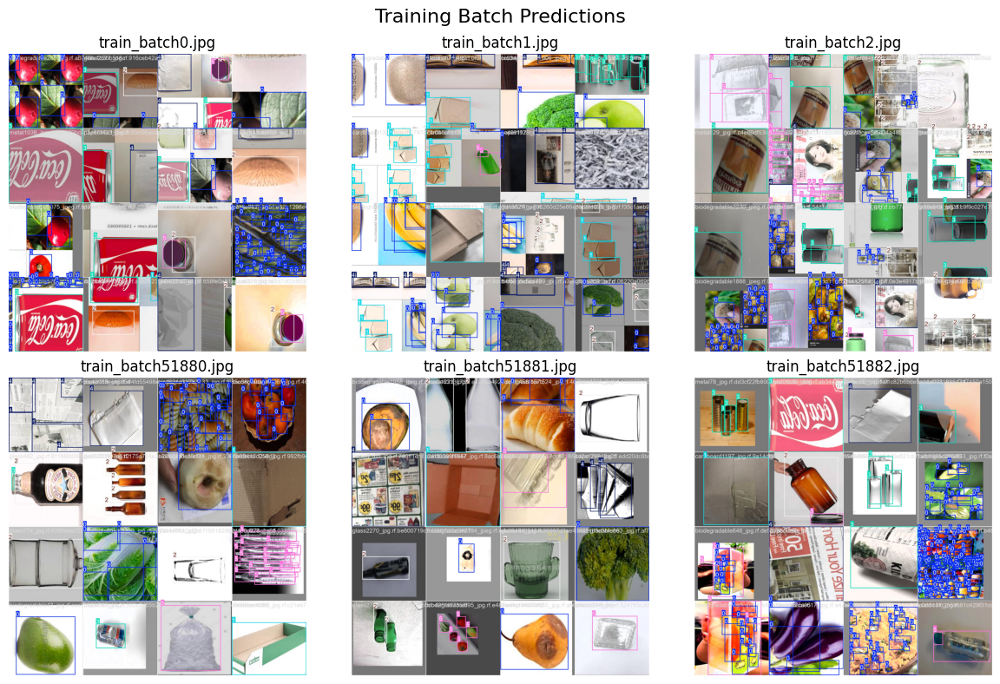

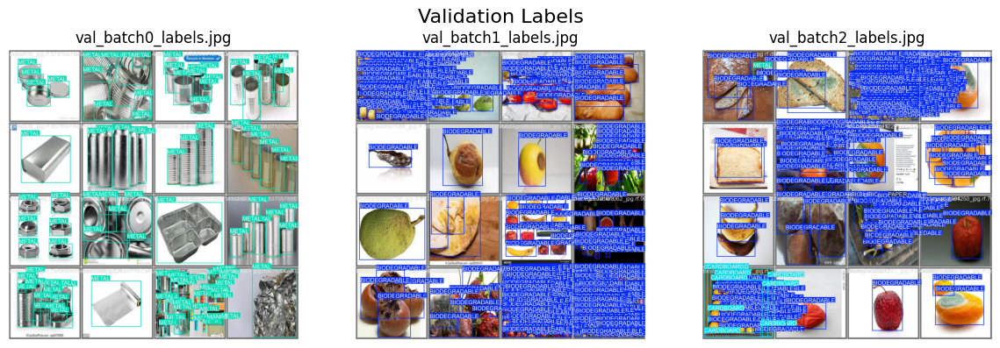

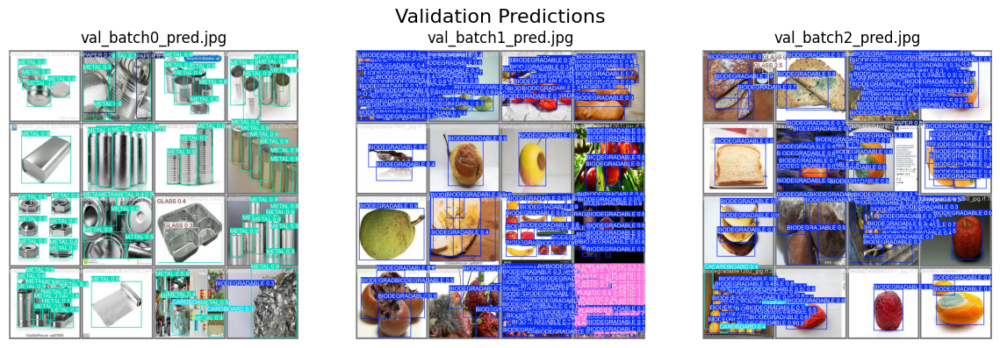

In [17]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt

run_path = os.path.join("runs", "detect", "train")
train_batches = sorted(glob.glob(os.path.join(run_path, "train_batch*.jpg")))
val_label_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_labels.jpg")))
val_pred_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_pred.jpg")))

def show_image_grid(image_paths, title, cols=3):
    imgs = [Image.open(img_path) for img_path in image_paths]
    rows = (len(imgs) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(image_paths[i]))
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_image_grid(train_batches, "Training Batch Predictions")
show_image_grid(val_label_batches, "Validation Labels")
show_image_grid(val_pred_batches, "Validation Predictions")


### Yolov8 Model: yolov8m.pt as Medium model size

In [1]:
# Clear GPU's VRAM for next stage!
import torch
import os
torch.cuda.empty_cache()
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [2]:
from ultralytics import YOLO
import os

# Load a pretrained YOLO model: yolov8m
model = YOLO("yolov8m.pt")  # The model

cwd = os.getcwd()
path = os.path.join(cwd, "Dataset", "data.yaml")

# Train the model
model.train(data=path, epochs=50, imgsz=640, device=0)

Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7816MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/home/icebear_bares/Desktop/Cloudythescientist/Dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

train: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/train/labels.cache... 20752 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20752/20752 [00:00<?, ?it/s]
val: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/valid/labels.cache... 2098 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2098/2098 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.66G      1.277      1.723      1.436        162        640: 100%|██████████| 1297/1297 [08:27<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.04it/s]


                   all       2098      18916      0.479      0.402      0.414      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.87G      1.243       1.33      1.398        278        640: 100%|██████████| 1297/1297 [08:22<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916      0.465      0.374      0.385      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.11G      1.301      1.448      1.451        111        640:  94%|█████████▍| 1224/1297 [07:50<00:27,  2.62it/s]

       3/50       6.5G      1.308      1.454      1.454         84        640: 100%|██████████| 1297/1297 [08:19<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.03it/s]


                   all       2098      18916      0.442      0.337      0.341      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.87G      1.351      1.521      1.488        234        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.04it/s]


                   all       2098      18916       0.46      0.375      0.381      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.79G      1.313      1.413      1.462        173        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.04it/s]


                   all       2098      18916      0.483      0.398      0.417      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.03G       1.28      1.328      1.438        135        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.03it/s]


                   all       2098      18916      0.536      0.434      0.477      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.73G      1.257      1.277      1.424        146        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916       0.55      0.439      0.476      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.91G       1.23      1.215      1.404        125        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.04it/s]


                   all       2098      18916      0.563      0.458      0.514      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.14G      1.216      1.178      1.391        158        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.566      0.466      0.513       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.04G      1.205       1.15      1.392        149        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916      0.559       0.47      0.509      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.04G      1.177      1.102      1.371        136        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916        0.6      0.466      0.527      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.98G      1.178       1.08      1.361        212        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916      0.588      0.468      0.531       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.95G      1.171      1.062      1.357        173        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.06it/s]


                   all       2098      18916      0.607      0.471      0.547      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.04G      1.156      1.033      1.346        150        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.635      0.463       0.55      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.06G      1.134      1.009      1.333        170        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.607      0.513      0.563      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.79G       1.13     0.9906      1.329        272        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.626      0.518      0.565      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       7.2G      1.125     0.9718      1.325        149        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916        0.6      0.488      0.559      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.98G      1.117     0.9562      1.323        132        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.616      0.511      0.576      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.83G      1.111     0.9383       1.31        303        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.638      0.496      0.584      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.14G      1.096      0.921      1.303        239        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.627      0.535      0.584      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.96G      1.093     0.9028      1.297        256        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.623      0.532       0.59      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.86G       1.09     0.8883      1.292        187        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.641      0.545      0.591      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.16G      1.088     0.8854      1.297        244        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.612       0.54       0.59      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.08G       1.09     0.8664      1.288        239        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.648       0.51      0.586      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       6.9G      1.062      0.852      1.276        138        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.651      0.537        0.6      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       6.9G      1.068     0.8426      1.278        210        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.618      0.561      0.601      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.84G      1.059     0.8275      1.269        101        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.647      0.537        0.6      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.06G      1.056     0.8173       1.26        140        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.651      0.533      0.603      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.96G      1.042     0.8011       1.26        157        640: 100%|██████████| 1297/1297 [08:17<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.647      0.551      0.608      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.88G      1.045     0.7915      1.254        416        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.658      0.542      0.609      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.98G      1.038     0.7757      1.248        178        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.638      0.553       0.61      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.85G      1.028     0.7693      1.243        129        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.649       0.55      0.608      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.16G      1.016      0.754      1.239        142        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.642      0.552      0.604      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.06G      1.012     0.7463      1.235        104        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.672      0.546      0.607      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.82G      1.007     0.7352      1.232        196        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.671      0.548      0.609      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.95G      1.005     0.7283      1.229        195        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.688      0.544      0.611       0.44

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.96G     0.9922     0.7156      1.223        248        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.667      0.554      0.614      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.04G     0.9925      0.708      1.216        144        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.644      0.561      0.614      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       6.8G     0.9822     0.6901       1.21        168        640: 100%|██████████| 1297/1297 [08:18<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.645      0.569      0.614      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.18G     0.9611     0.6801        1.2        371        640:  21%|██        | 268/1297 [01:42<06:41,  2.56it/s]

      40/50      6.89G     0.9663     0.6845      1.202        181        640: 100%|██████████| 1297/1297 [08:19<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.07it/s]


                   all       2098      18916      0.656      0.574      0.616      0.441
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.02G     0.9522     0.6228      1.197        103        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.678      0.562      0.616      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.9G     0.9396     0.6026      1.191        152        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916       0.67      0.565      0.613      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.02G     0.9347     0.5913      1.185         62        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.676      0.566      0.614      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.88G     0.9247     0.5794       1.18         47        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.681      0.562      0.616      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.02G     0.9063     0.5585      1.171        178        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.03it/s]


                   all       2098      18916      0.685       0.56      0.614      0.441

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.86G     0.9021     0.5494      1.169        155        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.695      0.554      0.615      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.02G     0.8969      0.541      1.161         42        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.708      0.549      0.615      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.86G     0.8833     0.5271      1.154         73        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.683      0.561      0.614      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.02G     0.8789     0.5193      1.145         81        640: 100%|██████████| 1297/1297 [08:15<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.09it/s]


                   all       2098      18916      0.675      0.569      0.615      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.96G     0.8659     0.5064       1.14        102        640: 100%|██████████| 1297/1297 [08:14<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.08it/s]


                   all       2098      18916      0.676      0.568      0.614      0.442

50 epochs completed in 7.221 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 52.0MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7816MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:21<00:00,  3.12it/s]


                   all       2098      18916      0.682      0.561      0.614      0.443
         BIODEGRADABLE        676      13637      0.816      0.546      0.684      0.404
             CARDBOARD        438       1292      0.763      0.593      0.685       0.54
                 GLASS        805       2380      0.906      0.754      0.863      0.679
                 METAL        398       1360      0.858      0.683      0.774      0.559
                 PAPER         15         33      0.145      0.212      0.108     0.0805
               PLASTIC         91        214      0.604      0.579      0.572      0.393
Speed: 0.2ms preprocess, 7.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x73c9589bfb90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

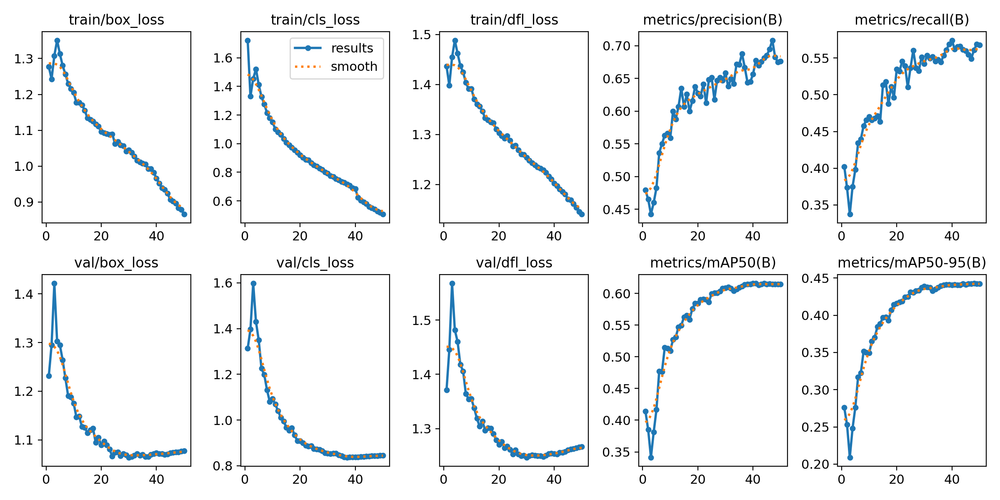

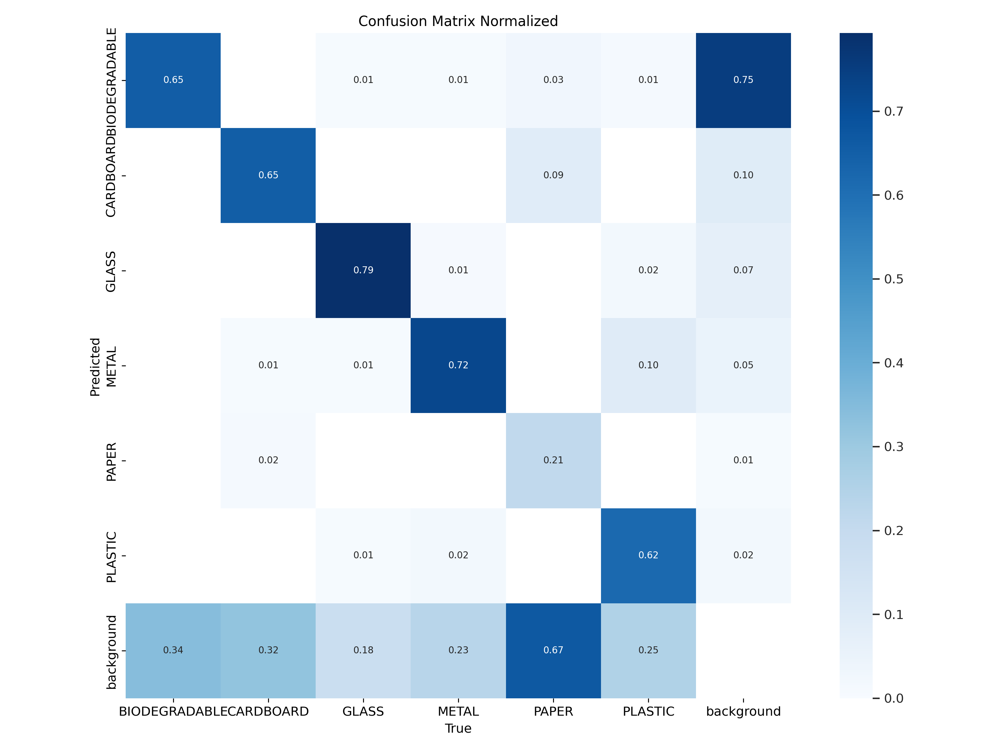

Best weights path: runs/detect/train2/weights/best.pt


In [14]:
import os
from IPython.display import Image, display

runs_dir = os.path.join("runs", "detect", "train2")
results_img = os.path.join(runs_dir, "results.png")
confusion_matrix_img = os.path.join(runs_dir, "confusion_matrix_normalized.png")
weights_path = os.path.join(runs_dir, "weights", "best.pt")

if os.path.exists(results_img):
    display(Image(filename=results_img))
    display(Image(filename=confusion_matrix_img))
else:
    print("results.png or not found at:", results_img)

if os.path.exists(weights_path):
    print(f"Best weights path: {weights_path}")
else:
    print("best.pt not found at:", weights_path)

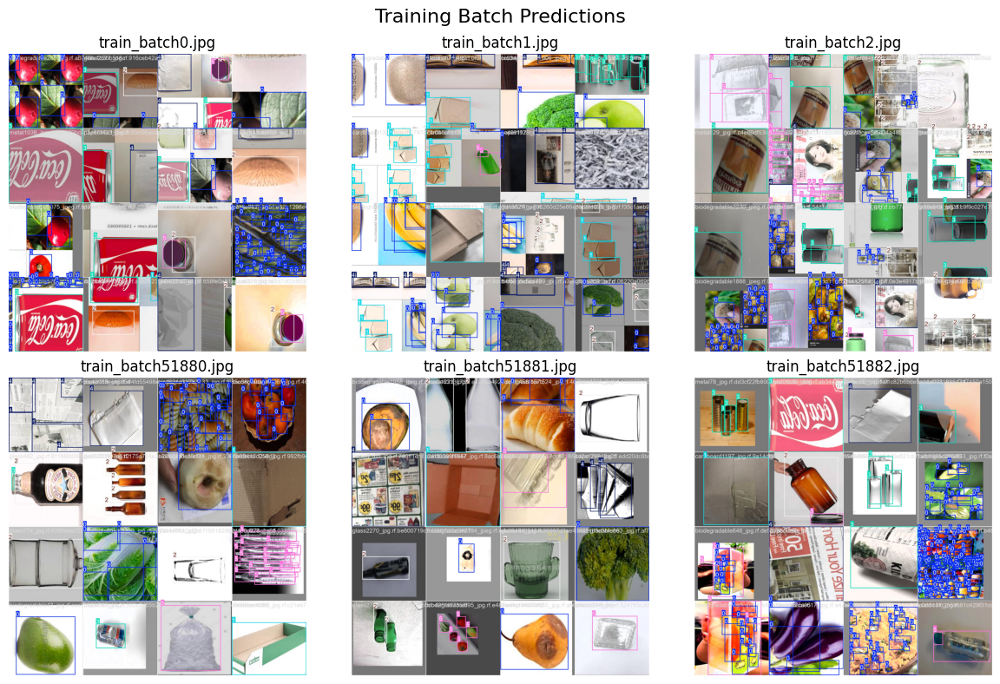

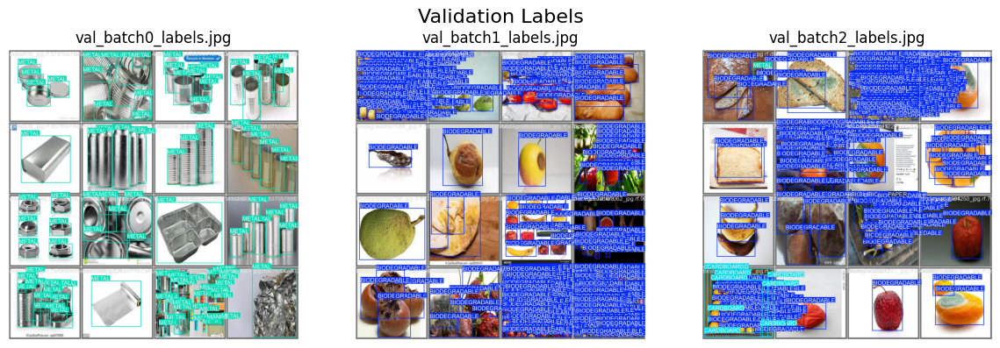

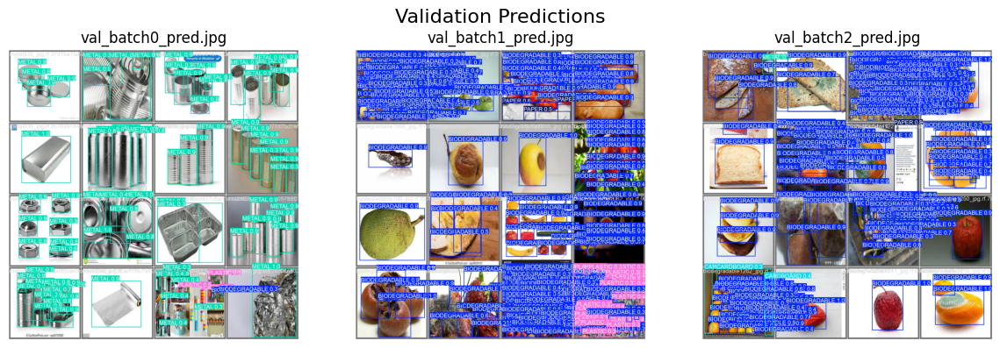

In [1]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt

run_path = os.path.join("runs", "detect", "train2")
train_batches = sorted(glob.glob(os.path.join(run_path, "train_batch*.jpg")))
val_label_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_labels.jpg")))
val_pred_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_pred.jpg")))

def show_image_grid(image_paths, title, cols=3):
    imgs = [Image.open(img_path) for img_path in image_paths]
    rows = (len(imgs) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(image_paths[i]))
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_image_grid(train_batches, "Training Batch Predictions")
show_image_grid(val_label_batches, "Validation Labels")
show_image_grid(val_pred_batches, "Validation Predictions")

### Yolov8 Model: yolov8x.pt as Large model size

In [1]:
# Clear GPU's VRAM for next stage!
import torch
import os
torch.cuda.empty_cache()
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [2]:
from ultralytics import YOLO
import os

# Load a pretrained YOLO model: yolov8x
model = YOLO("yolov8x.pt")  # The model

cwd = os.getcwd()
path = os.path.join(cwd, "Dataset", "data.yaml")

# Train the model
model.train(data=path, epochs=50, batch=2, imgsz=640, device=0)

Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7816MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/home/icebear_bares/Desktop/Cloudythescientist/Dataset/data.yaml, epochs=50, time=None, patience=100, batch=2, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sh

train: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/train/labels.cache... 20752 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20752/20752 [00:00<?, ?it/s]
val: Scanning /home/icebear_bares/Desktop/Cloudythescientist/Dataset/valid/labels.cache... 2098 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2098/2098 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.62G      1.126      1.894      1.486         15        640: 100%|██████████| 10376/10376 [22:40<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.49it/s]


                   all       2098      18916      0.491      0.389      0.403      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.86G      1.141      1.653      1.505        179        640: 100%|██████████| 10376/10376 [21:49<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.48it/s]

                   all       2098      18916      0.438      0.366      0.366      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.88G      1.222      1.806      1.576         74        640: 100%|██████████| 10376/10376 [21:43<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]


                   all       2098      18916      0.444      0.334      0.349      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.88G      1.239      1.849      1.601          7        640: 100%|██████████| 10376/10376 [21:41<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.48it/s]

                   all       2098      18916      0.483      0.336      0.351      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.88G      1.194      1.715      1.566         10        640: 100%|██████████| 10376/10376 [21:40<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]


                   all       2098      18916      0.494      0.373      0.393      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.88G      1.153      1.605      1.527          6        640: 100%|██████████| 10376/10376 [21:40<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.48it/s]

                   all       2098      18916      0.509      0.389      0.422      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.92G      1.124      1.538      1.506          5        640: 100%|██████████| 10376/10376 [21:41<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.48it/s]


                   all       2098      18916      0.525      0.406      0.449       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.92G      1.096      1.469      1.488          4        640: 100%|██████████| 10376/10376 [21:40<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.50it/s]

                   all       2098      18916      0.515      0.421       0.47      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.96G      1.085      1.408      1.471         30        640: 100%|██████████| 10376/10376 [21:40<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.49it/s]

                   all       2098      18916      0.535      0.423      0.468      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.96G      1.074       1.37      1.464         25        640: 100%|██████████| 10376/10376 [21:41<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916      0.547      0.443      0.483      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.96G      1.056      1.318      1.443         20        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]


                   all       2098      18916      0.553      0.443      0.498      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.96G      1.046      1.285      1.439         11        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]


                   all       2098      18916       0.55      0.467      0.505      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.96G      1.032      1.266      1.427         47        640: 100%|██████████| 10376/10376 [21:46<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916      0.553      0.449       0.49      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.96G      1.022       1.23      1.416         13        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]


                   all       2098      18916      0.553      0.469      0.509       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.96G      1.022      1.201      1.408          6        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.568      0.481      0.529      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.96G      1.007      1.177        1.4          9        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]

                   all       2098      18916      0.592      0.465      0.523      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.96G     0.9997      1.153      1.397          7        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916      0.587      0.469      0.534       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.96G     0.9862      1.134      1.387         17        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]

                   all       2098      18916      0.579      0.499      0.539      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.96G     0.9743      1.108      1.376         40        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]


                   all       2098      18916      0.598       0.48      0.547       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.98G     0.9835      1.096      1.376         41        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.599      0.491      0.564      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.98G     0.9712      1.078      1.369         35        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.602      0.501      0.566      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.98G     0.9567      1.055      1.364          3        640: 100%|██████████| 10376/10376 [21:43<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]

                   all       2098      18916      0.615      0.492      0.568      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.98G     0.9629      1.039      1.363         17        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]


                   all       2098      18916      0.627      0.497       0.57      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.98G     0.9504      1.014      1.354          9        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.627      0.496      0.574      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.98G     0.9486      1.006      1.354         18        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]


                   all       2098      18916      0.612      0.508      0.574      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.98G     0.9342     0.9806      1.341          5        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]


                   all       2098      18916      0.625      0.505       0.58      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.98G     0.9326     0.9664      1.342         31        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]


                   all       2098      18916      0.625      0.519      0.583      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.98G      0.929     0.9501      1.335          3        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]

                   all       2098      18916      0.632       0.52      0.587      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.98G     0.9194     0.9321      1.328         34        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]


                   all       2098      18916      0.627      0.528       0.59      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.98G     0.9165     0.9229      1.327         25        640: 100%|██████████| 10376/10376 [21:43<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]

                   all       2098      18916      0.622       0.54       0.59      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.98G     0.9068     0.9032      1.317         13        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.621      0.543      0.593      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.98G     0.9024      0.891      1.314          8        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]

                   all       2098      18916      0.631      0.536      0.596      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.98G     0.9006     0.8851      1.314          7        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.634      0.537      0.596      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.98G     0.8946     0.8672      1.309         13        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]


                   all       2098      18916      0.633       0.55      0.599      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.98G     0.8845      0.847      1.299          7        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.45it/s]

                   all       2098      18916      0.648      0.546      0.601      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.98G      0.878     0.8326      1.302          3        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]


                   all       2098      18916      0.651      0.547      0.601      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.98G     0.8747     0.8197      1.294         53        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]


                   all       2098      18916      0.656      0.549      0.603      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.98G     0.8724     0.8089       1.29          4        640: 100%|██████████| 10376/10376 [21:44<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.657      0.542      0.605      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.98G     0.8656     0.7943      1.284         32        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.672      0.536      0.605      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.98G     0.8594     0.7748      1.277          9        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.664      0.541      0.606      0.438


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.98G     0.6788     0.5863      1.172         31        640: 100%|██████████| 10376/10376 [21:45<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.663      0.541      0.605      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.98G     0.6737     0.5697      1.169         60        640: 100%|██████████| 10376/10376 [21:48<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916      0.661      0.542      0.604      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.98G     0.6653     0.5509       1.16          5        640: 100%|██████████| 10376/10376 [21:48<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.42it/s]


                   all       2098      18916      0.662       0.54      0.602      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.98G      0.656     0.5277      1.156          4        640: 100%|██████████| 10376/10376 [21:47<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.46it/s]

                   all       2098      18916      0.658       0.54        0.6      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.98G     0.6459     0.5131      1.148          2        640: 100%|██████████| 10376/10376 [21:50<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916       0.66      0.537      0.598      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.98G     0.6412     0.4961      1.145         10        640: 100%|██████████| 10376/10376 [21:51<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.44it/s]

                   all       2098      18916      0.665      0.533      0.596      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.98G     0.6354     0.4841       1.14          2        640: 100%|██████████| 10376/10376 [21:53<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.42it/s]

                   all       2098      18916      0.658      0.535      0.595      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.98G     0.6246     0.4664      1.129         21        640: 100%|██████████| 10376/10376 [21:54<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.43it/s]

                   all       2098      18916      0.661      0.532      0.595      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.98G     0.6205     0.4559      1.125          4        640: 100%|██████████| 10376/10376 [21:47<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]

                   all       2098      18916      0.662      0.533      0.593       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.98G     0.6175     0.4471      1.124          4        640: 100%|██████████| 10376/10376 [21:43<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:45<00:00, 11.47it/s]

                   all       2098      18916      0.661      0.533      0.593      0.429



50 epochs completed in 18.789 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 136.7MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.12.7 torch-2.8.0.dev20250411+cu128 CUDA:0 (NVIDIA GeForce RTX 4060, 7816MiB)
Model summary (fused): 112 layers, 68,129,346 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 525/525 [00:41<00:00, 12.50it/s]


                   all       2098      18916      0.663      0.542      0.606      0.438
         BIODEGRADABLE        676      13637       0.82      0.505      0.661      0.388
             CARDBOARD        438       1292      0.795      0.541      0.664      0.532
                 GLASS        805       2380      0.905       0.72      0.841      0.665
                 METAL        398       1360      0.851      0.686      0.785       0.56
                 PAPER         15         33     0.0847      0.152     0.0859     0.0738
               PLASTIC         91        214      0.524       0.65      0.595      0.408
Speed: 0.2ms preprocess, 17.4ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7de70bb9f170>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

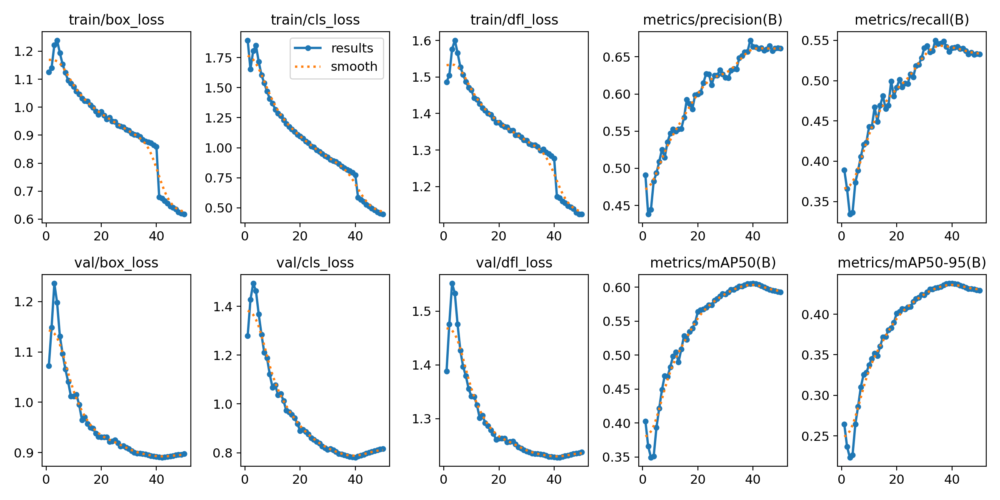

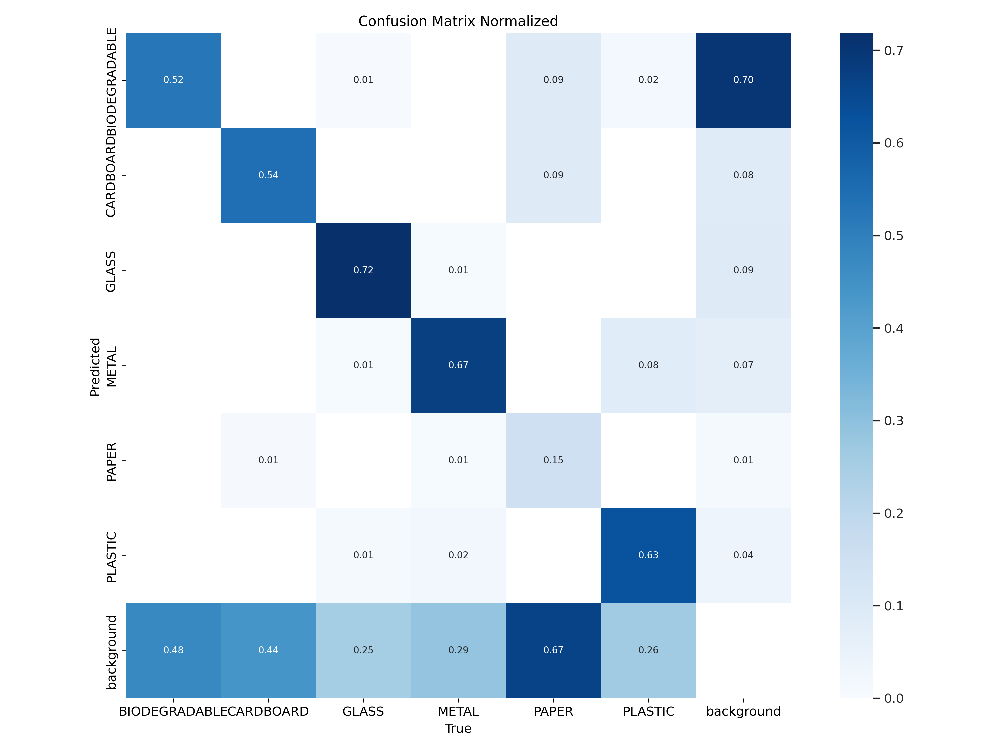

Best weights path: runs/detect/train4/weights/best.pt


In [15]:
import os
from IPython.display import Image, display

runs_dir = os.path.join("runs", "detect", "train4")
results_img = os.path.join(runs_dir, "results.png")
confusion_matrix_img = os.path.join(runs_dir, "confusion_matrix_normalized.png")
weights_path = os.path.join(runs_dir, "weights", "best.pt")

if os.path.exists(results_img):
    display(Image(filename=results_img))
    display(Image(filename=confusion_matrix_img))
else:
    print("results.png or not found at:", results_img)

if os.path.exists(weights_path):
    print(f"Best weights path: {weights_path}")
else:
    print("best.pt not found at:", weights_path)

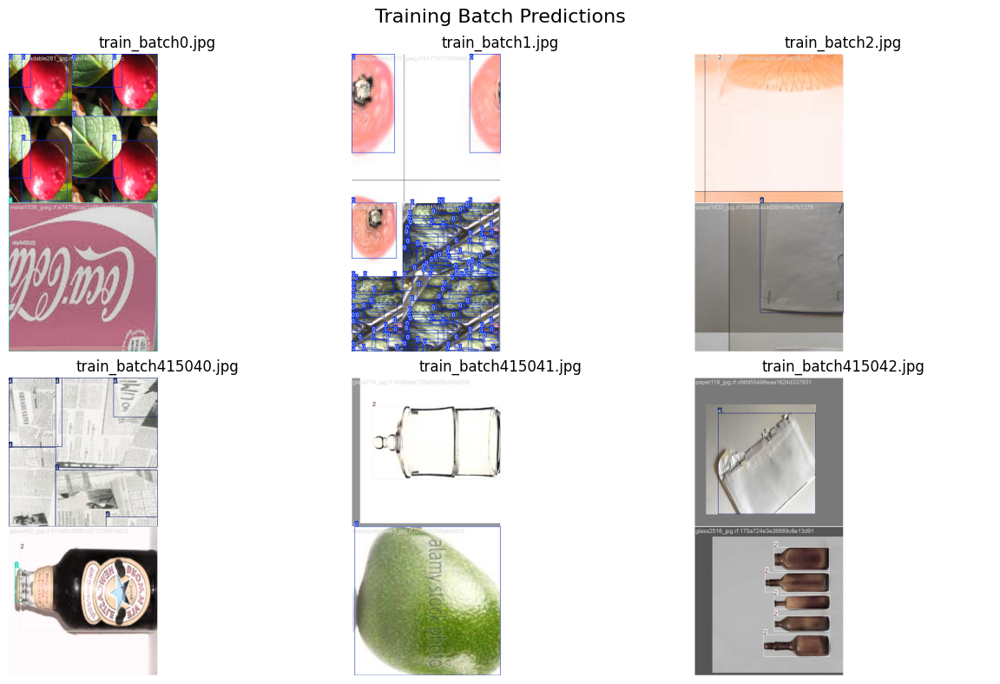

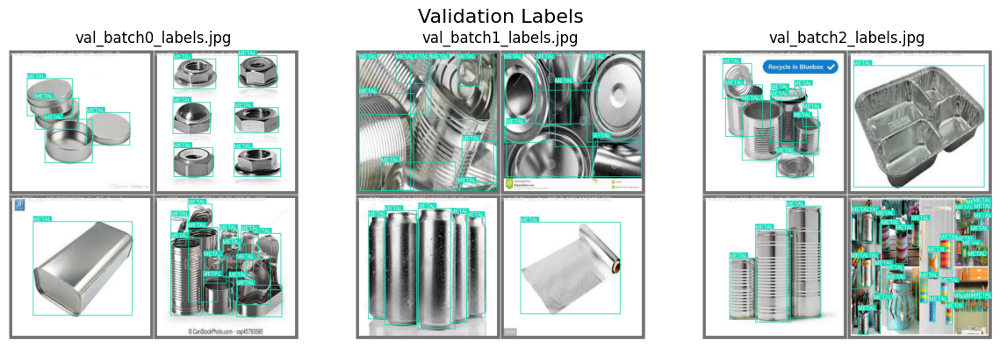

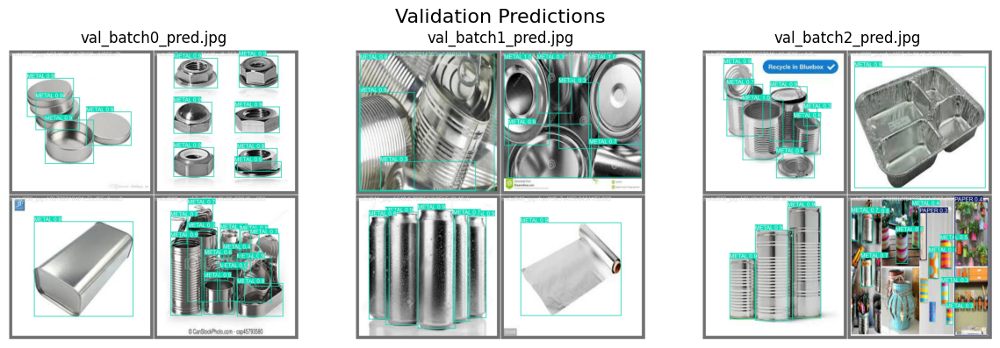

In [3]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt

run_path = os.path.join("runs", "detect", "train4")
train_batches = sorted(glob.glob(os.path.join(run_path, "train_batch*.jpg")))
val_label_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_labels.jpg")))
val_pred_batches = sorted(glob.glob(os.path.join(run_path, "val_batch*_pred.jpg")))

def show_image_grid(image_paths, title, cols=3):
    imgs = [Image.open(img_path) for img_path in image_paths]
    rows = (len(imgs) + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(image_paths[i]))
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_image_grid(train_batches, "Training Batch Predictions")
show_image_grid(val_label_batches, "Validation Labels")
show_image_grid(val_pred_batches, "Validation Predictions")

# Delete extrtact folder

In [1]:
import shutil

shutil.rmtree("Dataset")
print("Deleted extracted folder")

Deleted extracted folder
